# 0. Configuração de Ambiente **padrão**

In [1]:
%%bash

cd ..
./activateEnv.sh

In [2]:
%%bash
# Instalar os software que vamos usar nesta prática
mamba install -c bioconda -c conda-forge fastqc bwa cutadapt samtools kraken2 krona blast seqtk spades -y


Pinned packages:

  - python=3.10



error    libmamba Could not create directory '/usr/pkgs': Permission denied



Transaction

  Prefix: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/env

  Updating specs:

   - fastqc
   - bwa
   - cutadapt
   - samtools
   - kraken2
   - krona
   - blast
   - seqtk
   - spades


  Package                     Version  Build             Channel           Size
──────��──────────────────────────────────────────────────────────────────���───────
  Install:
─────────────────────��───────────────────────────────────────────────────────────

  + blast                      2.17.0  h66d330f_0        bioconda          85MB
  + curl                       8.14.1  h332b0f4_0        conda-forge      180kB
  + entrez-direct                24.0  he881be0_0        bioconda          17MB
  + kraken2                     2.1.6  pl5321h077b44d_0  bioconda           3MB
  + krona                       2.8.1  pl5321hdfd78af_1  bioconda         158kB
  + libgfortran                15.2.0  h69a702a_7        conda-forge     Cached
  + libgfortran-ng             15.2.0  h69a

In [3]:
%%bash
# Testa se um deles foi instalado corretamente (deve printar o manual de uso do programa)
kraken2 --help

Usage: kraken2 [options] <filename(s)>

Options:
  --db NAME               Name for Kraken 2 DB
                          (default: none)
  --threads NUM           Number of threads (default: 1)
  --quick                 Quick operation (use first hit or hits)
  --unclassified-out FILENAME
                          Print unclassified sequences to filename
  --classified-out FILENAME
                          Print classified sequences to filename
  --output FILENAME       Print output to filename (default: stdout); "-" will
                          suppress normal output
  --confidence FLOAT      Confidence score threshold (default: 0.0); must be
                          in [0, 1].
  --minimum-base-quality NUM
                          Minimum base quality used in classification (def: 0,
                          only effective with FASTQ input).
  --report FILENAME       Print a report with aggregrate counts/clade to file
  --use-mpa-style         With --report, format report output

In [4]:
%%bash
# Criar as pastas para organizar os arquivos que serão gerados
mkdir raw fastqc cutadapt bwa krakenDB kraken2 krona blast spades

In [5]:
%%bash
# Mover arquivos para as suas respectivas pastas
mv *.fastq.gz raw/
mv mock-metagenomics.fasta blast/
mv CHM13.fasta bwa/

**Checkpoint 1:**  
Antes de seguir, verifique se as pastas foram criadas. Os arquivos fastqs do pacientes deve estar dentro da pasta raw/ (2 arquivos), o arquivo fasta da referência deve estar dentro da pasta bwa/ e o arquivo fasta do banco dentro de blast/.

# 1. Controle de Qualidade

A partir de agora, serão realizados todos os comandos para o ```patient1```. Ao terminar, você precisará fazer o mesmo para o ```patient2```.

In [6]:
%%bash
# Gerar o relatório da qualidade dos reads de sequenciamento
fastqc -o fastqc/ raw/patient-dark-fungi_R1.fastq.gz raw/patient-dark-fungi_R2.fastq.gz

application/gzip
application/gzip


Started analysis of patient-dark-fungi_R1.fastq.gz
Approx 5% complete for patient-dark-fungi_R1.fastq.gz
Approx 10% complete for patient-dark-fungi_R1.fastq.gz
Approx 15% complete for patient-dark-fungi_R1.fastq.gz
Approx 20% complete for patient-dark-fungi_R1.fastq.gz
Approx 25% complete for patient-dark-fungi_R1.fastq.gz
Approx 30% complete for patient-dark-fungi_R1.fastq.gz
Approx 35% complete for patient-dark-fungi_R1.fastq.gz
Approx 40% complete for patient-dark-fungi_R1.fastq.gz
Approx 45% complete for patient-dark-fungi_R1.fastq.gz
Approx 50% complete for patient-dark-fungi_R1.fastq.gz
Approx 55% complete for patient-dark-fungi_R1.fastq.gz
Approx 60% complete for patient-dark-fungi_R1.fastq.gz
Approx 65% complete for patient-dark-fungi_R1.fastq.gz
Approx 70% complete for patient-dark-fungi_R1.fastq.gz
Approx 75% complete for patient-dark-fungi_R1.fastq.gz
Approx 80% complete for patient-dark-fungi_R1.fastq.gz
Approx 85% complete for patient-dark-fungi_R1.fastq.gz
Approx 90% comp

Analysis complete for patient-dark-fungi_R1.fastq.gz


Started analysis of patient-dark-fungi_R2.fastq.gz
Approx 5% complete for patient-dark-fungi_R2.fastq.gz
Approx 10% complete for patient-dark-fungi_R2.fastq.gz
Approx 15% complete for patient-dark-fungi_R2.fastq.gz
Approx 20% complete for patient-dark-fungi_R2.fastq.gz
Approx 25% complete for patient-dark-fungi_R2.fastq.gz
Approx 30% complete for patient-dark-fungi_R2.fastq.gz
Approx 35% complete for patient-dark-fungi_R2.fastq.gz
Approx 40% complete for patient-dark-fungi_R2.fastq.gz
Approx 45% complete for patient-dark-fungi_R2.fastq.gz
Approx 50% complete for patient-dark-fungi_R2.fastq.gz
Approx 55% complete for patient-dark-fungi_R2.fastq.gz
Approx 60% complete for patient-dark-fungi_R2.fastq.gz
Approx 65% complete for patient-dark-fungi_R2.fastq.gz
Approx 70% complete for patient-dark-fungi_R2.fastq.gz
Approx 75% complete for patient-dark-fungi_R2.fastq.gz
Approx 80% complete for patient-dark-fungi_R2.fastq.gz
Approx 85% complete for patient-dark-fungi_R2.fastq.gz
Approx 90% comp

Analysis complete for patient-dark-fungi_R2.fastq.gz


In [7]:
%%bash
# Filtrar sequências muito pequenas e cortar as pontas
cutadapt \
  -u 5 -U 5 \
  -u -5 -U -5 \
  -m 90 \
  -o cutadapt/patient-dark-fungi-trimmed_R1.fastq.gz \
  -p cutadapt/patient-dark-fungi-trimmed_R2.fastq.gz \
  raw/patient-dark-fungi_R1.fastq.gz \
  raw/patient-dark-fungi_R2.fastq.gz

This is cutadapt 5.1 with Python 3.10.18
Command line parameters: -u 5 -U 5 -u -5 -U -5 -m 90 -o cutadapt/patient-dark-fungi-trimmed_R1.fastq.gz -p cutadapt/patient-dark-fungi-trimmed_R2.fastq.gz raw/patient-dark-fungi_R1.fastq.gz raw/patient-dark-fungi_R2.fastq.gz
Processing paired-end reads on 1 core ...

=== Summary ===

Total read pairs processed:            200,000

== Read fate breakdown ==
Pairs that were too short:               2,274 (1.1%)
Pairs written (passing filters):       197,726 (98.9%)

Total basepairs processed:    51,989,868 bp
  Read 1:    25,997,866 bp
  Read 2:    25,992,002 bp
Total written (filtered):     47,522,220 bp (91.4%)
  Read 1:    23,762,097 bp
  Read 2:    23,760,123 bp


# 2. Preparar o banco de dados para busca de patógenos

Para este tipo de pipeline de bioinformática, o princípio é realizar buscas dos reads de sequênciamento contra um banco de sequências conhecidas, e assim fazer a classificação do que é desconhecido (com alguns passos adicionais como mostra a figura abaixo).  
O banco de dados de sequências conhecidas que vamos usar é muito importante, pois se ele não tiver o organismos que queremos identificar, ele não fará a classificação adequada.  

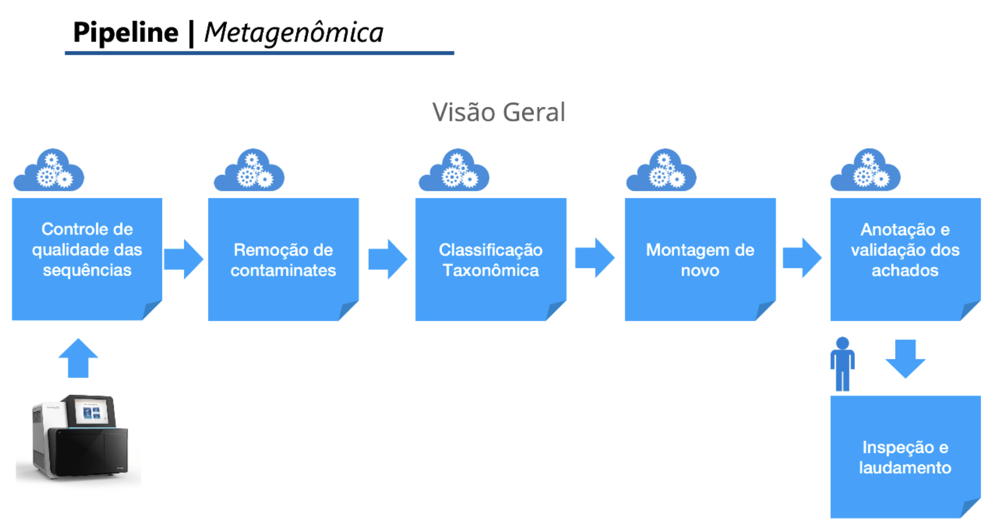

Comecemos com um banco geral de sequências referências de bactérias, alguns fungos, vírus e humanos.  

In [8]:
%%bash
# Download banco de bactérias, fungos, vírus e humano (cerca de 3 min)
wget https://genome-idx.s3.amazonaws.com/kraken/k2_pluspf_08_GB_20250714.tar.gz

--2025-10-12 09:39:14--  https://genome-idx.s3.amazonaws.com/kraken/k2_pluspf_08_GB_20250714.tar.gz
Resolving genome-idx.s3.amazonaws.com (genome-idx.s3.amazonaws.com)... 52.216.212.73, 16.182.37.209, 54.231.234.73, ...
Connecting to genome-idx.s3.amazonaws.com (genome-idx.s3.amazonaws.com)|52.216.212.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5940987009 (5.5G) [application/x-tar]
Saving to: ‘k2_pluspf_08_GB_20250714.tar.gz’

     0K .......... .......... .......... .......... ..........  0%  365K 4h24m
    50K .......... .......... .......... .......... ..........  0%  372K 4h22m
   100K .......... .......... .......... .......... ..........  0% 14.9M 2h57m
   150K .......... .......... .......... .......... ..........  0%  378K 3h16m
   200K .......... .......... .......... .......... ..........  0%  134M 2h37m
   250K .......... .......... .......... .......... ..........  0%  372K 2h54m
   300K .......... .......... .......... .......... ..........

In [9]:
%%bash
# Extrair o banco para uma pasta (cerca de 2 min)
tar -xzvf k2_pluspf_08_GB_20250714.tar.gz -C krakenDB/
rm k2_pluspf_08_GB_20250714.tar.gz

hash.k2d
opts.k2d
taxo.k2d
seqid2taxid.map
inspect.txt
ktaxonomy.tsv
library_report.tsv
nodes.dmp
names.dmp
database50mers.kmer_distrib
database75mers.kmer_distrib
database100mers.kmer_distrib
database150mers.kmer_distrib
database200mers.kmer_distrib
database250mers.kmer_distrib
database300mers.kmer_distrib
unmapped_accessions.txt


In [10]:
%%bash
# Download do banco de definições de taxonomia do NCBI
bash ../env/opt/krona/updateTaxonomy.sh

Fetching taxdump.tar.gz...
   Fetching checksum...
   Checksum for taxdump.tar.gz matches server.
Extracting taxonomy...

Cleaning up...

Finished.



Estando os bancos de sequências prontos, podemos seguir para a etapa de classificação das sequências desconhecidas.

# 3. Identificação Taxonômica

In [11]:
%%bash
# Buscar cada sequência contra um banco de dados e fazer a classificação (cerca de 1 min)
kraken2 --paired cutadapt/patient-dark-fungi-trimmed_R1.fastq.gz cutadapt/patient-dark-fungi-trimmed_R2.fastq.gz \
-db krakenDB/ --report kraken2/patient-dark-fungi-report.txt --report-minimizer --output kraken2/patient-dark-fungi-output.txt

Loading database information... done.
197726 sequences (47.52 Mbp) processed in 1.182s (10034.9 Kseq/m, 2411.82 Mbp/m).
  177926 sequences classified (89.99%)
  19800 sequences unclassified (10.01%)


In [12]:
%%bash
# Gerar um gráfico de pizza iterativo com a classificação do kraken
ktImportTaxonomy kraken2/patient-dark-fungi-output.txt \
-o krona/patient-dark-fungi-kraken.html -q 2 -t 3

   [ WARNING ]  Score column already in use; not reading scores.
   [ WARNING ]  Too many query IDs to store in chart; storing supplemental
                files in 'krona/patient-dark-fungi-kraken.html.files'.


Loading taxonomy...
Importing kraken2/patient-dark-fungi-output.txt...
Writing krona/patient-dark-fungi-kraken.html...


**Checkpoint 2**: Inspecione os resultados gerados, e veja se você consegue chegar a um diagnóstico plausível segundo a descrição do caso:  
Quais organismos apareceram?  
Eles são considerados patogênicos?

R: Cutibacterium Acnes,um bacterio anaerobio. Sim

**Complicação:** Você entregou este resultado para o médico do caso, e ele parece não estar satisfeito. Segundo ele, o paciente apresenta indícios fortes de infecção no sistema nervoso central. A cultura de amostras do paciente veio positiva para um fungo de coloração escura, que não pode porém ser identificado por outras técnicas. Há portanto, suspeita de infecção pelos chamados fungos negros.  

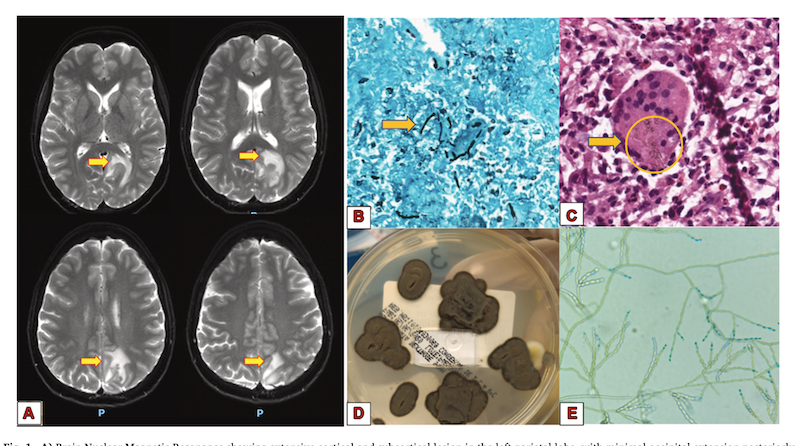

**Pergunta**: Porque não apareceu nenhum fungo negro na primeira classificação?   
O que são os resultados não classificados?

R: O fungo nao estava no banco de dados, entoa nao foi possivel classificar-lo, gerando resultados nao-classificados

Tendo em vista esta suspeita médica, vamos usar uma segunda abordagem de bioinformática:
- Sequências humanas não nos interessa, vamos remover
- Sequências muito curtas podem não ser boas para identificação de patógenos menos comuns, vamos fazer uma montagem delas
- Vamos incluir fungos negros conhecidos no nosso banco de dados, e realizar uma busca mais sensível com BLAST e alinhamentos

# 4. Remoção de contaminantes humanos

In [13]:
%%bash
# Indexar o genoma humano de referência para realizar o mapeamento e posterior remoção de contaminante
bwa index bwa/CHM13.fasta

[bwa_index] Pack FASTA... 0.12 sec
[bwa_index] Construct BWT for the packed sequence...
[BWTIncCreate] textLength=90181364, availableWord=18345488
[BWTIncConstructFromPacked] 10 iterations done. 30261092 characters processed.
[BWTIncConstructFromPacked] 20 iterations done. 55903300 characters processed.
[BWTIncConstructFromPacked] 30 iterations done. 78690164 characters processed.
[bwt_gen] Finished constructing BWT in 36 iterations.
[bwa_index] 8.92 seconds elapse.
[bwa_index] Update BWT... 0.09 sec
[bwa_index] Pack forward-only FASTA... 0.05 sec
[bwa_index] Construct SA from BWT and Occ... 4.48 sec
[main] Version: 0.7.19-r1273
[main] CMD: bwa index bwa/CHM13.fasta
[main] Real time: 13.743 sec; CPU: 13.671 sec


In [14]:
%%bash
# Proceder com o alinhamento contra o genoma humano (cerca de 2 min)
bwa mem bwa/CHM13.fasta \
  cutadapt/patient-dark-fungi-trimmed_R1.fastq.gz \
  cutadapt/patient-dark-fungi-trimmed_R2.fastq.gz \
  | samtools view -b > bwa/patient-dark-fungi-mapped-host.bam

[M::bwa_idx_load_from_disk] read 0 ALT contigs
[M::process] read 83206 sequences (10000175 bp)...
[M::process] read 83220 sequences (10000246 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 31292, 0, 0)
[M::mem_pestat] skip orientation FF as there are not enough pairs
[M::mem_pestat] analyzing insert size distribution for orientation FR...
[M::mem_pestat] (25, 50, 75) percentile: (319, 339, 360)
[M::mem_pestat] low and high boundaries for computing mean and std.dev: (237, 442)
[M::mem_pestat] mean and std.dev: (339.10, 29.90)
[M::mem_pestat] low and high boundaries for proper pairs: (196, 483)
[M::mem_pestat] skip orientation RF as there are not enough pairs
[M::mem_pestat] skip orientation RR as there are not enough pairs
[M::mem_process_seqs] Processed 83206 reads in 7.203 CPU sec, 7.122 real sec
[M::process] read 83220 sequences (10000098 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 31556, 0, 0)
[M::mem_pestat] skip orientation 

In [15]:
%%bash
# GCom a informação de mapeamento contida no BAM, vamos filtrar somente o que não mapeeou (o que não são sequências humanas)
samtools view -u -f 12 \
  -b bwa/patient-dark-fungi-mapped-host.bam \
  | samtools sort -n > bwa/patient-dark-fungi-unmapped-host.bam

In [16]:
%%bash
# Gerar FASTQ de reads não mapeados
samtools fastq bwa/patient-dark-fungi-unmapped-host.bam \
  -1 bwa/patient-dark-fungi-unmapped-host_R1.fastq \
  -2 bwa/patient-dark-fungi-unmapped-host_R2.fastq

[M::bam2fq_mainloop] discarded 0 singletons
[M::bam2fq_mainloop] processed 21530 reads


# 5. Montagem dos reads em sequências maiores

In [17]:
%%bash
# Realiza a junção das sequências menores em contigs maiores (montagem)
spades.py --meta -1 bwa/patient-dark-fungi-unmapped-host_R1.fastq -2 bwa/patient-dark-fungi-unmapped-host_R2.fastq -o spades/

Command line: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/env/bin/spades.py	--meta	-1	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-dark-fungi-unmapped-host_R1.fastq	-2	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-dark-fungi-unmapped-host_R2.fastq	-o	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/spades	

System information:
  SPAdes version: 4.2.0
  Python version: 3.10.18
  OS: Linux-6.17.1-arch1-1-x86_64-with-glibc2.42

Output dir: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/spades
Mode: read error correction and assembling
Debug mode is turned OFF

Dataset parameters:
  Metagenomic mode
  Reads:
    Library number: 1, library type: paired-end
      orientation: fr
      left reads: ['/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-dark-fungi-unmapped-host_R1.fastq']
      right reads: ['/home/figa/Documents/Programming/VSCode/M

# 6. Nova busca

Agora, somente com as sequências não humanas e maiores (montadas), vamos realizar a nova busca com BLAST.

In [18]:
%%bash
# Configura o banco novo para buscas via BLAST
makeblastdb -in blast/mock-metagenomics.fasta -dbtype nucl



Building a new DB, current time: 10/12/2025 10:13:54
New DB name:   /home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/blast/mock-metagenomics.fasta
New DB title:  blast/mock-metagenomics.fasta
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 5 sequences in 0.254894 seconds.




In [19]:
%%bash
# Realizar nova busca, agora com BLAST
blastn -query spades/scaffolds.fasta -db blast/mock-metagenomics.fasta -out blast/patient-dark-fungi-blast-scaffolds.txt -outfmt 6

In [20]:
%%bash
# Gera o gráfico de pizza para visualização dos resultados
ktImportTaxonomy blast/patient-dark-fungi-blast-scaffolds.txt -o krona/patient-dark-fungi-blast.html

Loading taxonomy...
Importing blast/patient-dark-fungi-blast-scaffolds.txt...
Writing krona/patient-dark-fungi-blast.html...


E agora? Apareceu algo novo que possa se encaixar na suspeita do médico? Qual o seu diagnóstico final?

R. Sim, apareceram dois fungos, um deles sendo um fungo que ataca o SNC. 

**==========Paciente 2============**

In [24]:
%%bash
# Gerar o relatório da qualidade dos reads de sequenciamento
fastqc -o fastqc/ raw/patient-fever-unknown-origem_R1.fastq.gz raw/patient-fever-unknown-origem_R2.fastq.gz

application/gzip
application/gzip
application/gzip


Started analysis of patient-fever-unknown-origem_R1.fastq.gz
Approx 5% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 5% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 10% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 10% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 15% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 15% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 20% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 20% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 25% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 25% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 30% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 30% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 35% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 35% complete for patient-fever-unknown-origem_R1.fastq.gz
Approx 40% complete for patient

Analysis complete for patient-fever-unknown-origem_R1.fastq.gz


Started analysis of patient-fever-unknown-origem_R2.fastq.gz
Approx 5% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 5% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 10% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 10% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 15% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 15% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 20% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 20% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 25% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 25% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 30% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 30% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 35% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 35% complete for patient-fever-unknown-origem_R2.fastq.gz
Approx 40% complete for patient

Analysis complete for patient-fever-unknown-origem_R2.fastq.gz


In [25]:
%%bash
# Filtrar sequências muito pequenas e cortar as pontas
cutadapt \
  -u 5 -U 5 \
  -u -5 -U -5 \
  -m 90 \
  -o cutadapt/patient-unknown-trimmed_R1.fastq.gz \
  -p cutadapt/patient-unknown-trimmed_R2.fastq.gz \
  raw/patient-fever-unknown-origem_R1.fastq.gz \
  raw/patient-fever-unknown-origem_R2.fastq.gz

This is cutadapt 5.1 with Python 3.10.18
Command line parameters: -u 5 -U 5 -u -5 -U -5 -m 90 -o cutadapt/patient-unknown-trimmed_R1.fastq.gz -p cutadapt/patient-unknown-trimmed_R2.fastq.gz raw/patient-fever-unknown-origem_R1.fastq.gz raw/patient-fever-unknown-origem_R2.fastq.gz
Processing paired-end reads on 1 core ...
adapt/patient-unknown-trimmed_R1.fastq.gz -p cutadapt/patient-unknown-trimmed_R2.fastq.gz raw/patient-fever-unknown-origem_R1.fastq.gz raw/patient-fever-unknown-origem_R2.fastq.gz
Processing paired-end reads on 1 core ...

=== Summary ===

Total read pairs processed:            500,000

== Read fate breakdown ==
Pairs that were too short:                  19 (0.0%)
Pairs written (passing filters):       499,981 (100.0%)

Total basepairs processed:   139,991,937 bp
  Read 1:    69,996,513 bp
  Read 2:    69,995,424 bp
Total written (filtered):    129,987,815 bp (92.9%)
  Read 1:    64,994,652 bp
  Read 2:    64,993,163 bp

=== Summary ===

Total read pairs processed:    

In [26]:
%%bash
# Buscar sequências num Database (tudo exceto fungos)
kraken2 --paired \
  cutadapt/patient-unknown-trimmed_R1.fastq.gz \
  cutadapt/patient-unknown-trimmed_R2.fastq.gz \
  --db krakenDB/ \
  --report kraken2/patient-unknown-report.txt \
  --output kraken2/patient-unknown-output.txt

Loading database information... done.
 done.
499981 sequences (129.99 Mbp) processed in 3.136s (9567.2 Kseq/m, 2487.33 Mbp/m).
  465212 sequences classified (93.05%)
  34769 sequences unclassified (6.95%)
499981 sequences (129.99 Mbp) processed in 3.136s (9567.2 Kseq/m, 2487.33 Mbp/m).
  465212 sequences classified (93.05%)
  34769 sequences unclassified (6.95%)


In [27]:
%%bash
# Gerar visualização Krona a partir da saída do kraken2
ktImportTaxonomy kraken2/patient-unknown-output.txt -o krona/patient-unknown-kraken.html

   [ WARNING ]  Too many query IDs to store in chart; storing supplemental
                files in 'krona/patient-unknown-kraken.html.files'.
'krona/patient-unknown-kraken.html.files'.


Loading taxonomy...
Importing kraken2/patient-unknown-output.txt...
Writing krona/patient-unknown-kraken.html...
aken.html...


In [28]:
%%bash
# Mapear contra o genoma de referência (ex.: hospedador)
bwa mem bwa/CHM13.fasta \
  cutadapt/patient-unknown-trimmed_R1.fastq.gz \
  cutadapt/patient-unknown-trimmed_R2.fastq.gz \
  | samtools view -b -o bwa/patient-unknown-mapped-host.bam

[M::bwa_idx_load_from_disk] read 0 ALT contigs
[M::process] read 76934 sequences (10000051 bp)...
[M::process] read 76934 sequences (10000051 bp)...
[M::process] read 76922 sequences (10000075 bp)...
[M::process] read 76922 sequences (10000075 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 29192, 0, 0)
[M::mem_pestat] skip orientation FF as there are not enough pairs
[M::mem_pestat] analyzing insert size distribution for orientation FR...
[M::mem_pestat] (25, 50, 75) percentile: (325, 339, 352)
[M::mem_pestat] low and high boundaries for computing mean and std.dev: (271, 406)
[M::mem_pestat] mean and std.dev: (338.83, 19.84)
[M::mem_pestat] low and high boundaries for proper pairs: (244, 433)
[M::mem_pestat] skip orientation RF as there are not enough pairs
[M::mem_pestat] skip orientation RR as there are not enough pairs
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 29192, 0, 0)
[M::mem_pestat] skip orientation FF as there are not enough

In [29]:
%%bash
# Extrair pares não mapeados (provavelmente não-hospedeiro)
samtools view -b -f 12 bwa/patient-unknown-mapped-host.bam \
  | samtools sort -n -o bwa/patient-unknown-unmapped-host.bam
samtools fastq bwa/patient-unknown-unmapped-host.bam \
  -1 bwa/patient-unknown-unmapped-host_R1.fastq \
  -2 bwa/patient-unknown-unmapped-host_R2.fastq

[M::bam2fq_mainloop] discarded 0 singletons
[M::bam2fq_mainloop] processed 52594 reads


In [32]:
%%bash
# Montar com SPAdes metagenômico usando os pares não mapeados
spades.py --meta \
  -1 bwa/patient-unknown-unmapped-host_R1.fastq \
  -2 bwa/patient-unknown-unmapped-host_R2.fastq \
  -o spades-unknown/

Command line: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/env/bin/spades.py	--meta	-1	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-unknown-unmapped-host_R1.fastq	-2	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-unknown-unmapped-host_R2.fastq	-o	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/spades-unknown	

System information:
  SPAdes version: 4.2.0
  Python version: 3.10.18
  OS: Linux-6.17.1-arch1-1-x86_64-with-glibc2.42

Output dir: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/spades-unknown
Mode: read error correction and assembling
Debug mode is turned OFF

Dataset parameters:
  Metagenomic mode
  Reads:
    Library n1	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-unknown-unmapped-host_R1.fastq	-2	/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-unknown-unmapped-host_R2.fastq	-o	/home/figa/Docum

umber: 1, library type: paired-end
      orientation: fr
      left reads: ['/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-unknown-unmapped-host_R1.fastq']
      right reads: ['/home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/bwa/patient-unknown-unmapped-host_R2.fastq']
      interlaced reads: not specified
      single reads: not specified
      merged reads: not specified
Read error correction parameters:
  Iterations: 1
  PHRED offset will be auto-detected
  Corrected reads will be compressed
Assembly parameters:
  k: [21, 33, 55]
  Repeat resolution is enabled
  Mismatch careful mode is turned OFF
  MismatchCorrector will be SKIPPED
  Coverage cutoff is turned OFF
  Assembly graph output will use GFA v1.2 format
Other parameters:
  Dir for temp files: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/spades-unknown/tmp
  Threads: 16
  Memory limit (in Gb): 30


======= SPAdes pipeline started. Log can be found here

In [36]:
%%bash
makeblastdb -in blast/mock-metagenomics-unknown.fasta -dbtype nucl -out blast/mock-metagenomics-unknown




Building a new DB, current time: 10/12/2025 11:06:45
New DB name:   /home/figa/Documents/Programming/VSCode/Metagenomics-Course/aula-6/blast/mock-metagenomics-unknown
New DB title:  blast/mock-metagenomics-unknown.fasta
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 3000000000B
ng/VSCode/Metagenomics-Course/aula-6/blast/mock-metagenomics-unknown
New DB title:  blast/mock-metagenomics-unknown.fasta
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 3000000000B


BLAST options error: File blast/mock-metagenomics-unknown.fasta does not exist


CalledProcessError: Command 'b'makeblastdb -in blast/mock-metagenomics-unknown.fasta -dbtype nucl -out blast/mock-metagenomics-unknown\n'' returned non-zero exit status 1.

In [34]:
%%bash
# Buscar scaffolds montados contra banco de referência (blast)
blastn -query spades-unknown/scaffolds.fasta \
  -subject blast/mock-metagenomics.fasta \
  -out blast/patient-unknown-blast-scaffolds.txt -outfmt 6

In [35]:
%%bash
# Gerar Krona a partir do resultado do blast
ktImportTaxonomy blast/patient-unknown-blast-scaffolds.txt \
  -o krona/patient-unknown-blast.html

Loading taxonomy...
Importing blast/patient-unknown-blast-scaffolds.txt...
Writing krona/patient-unknown-blast.html...
nown-blast.html...


N achou nada. Talvez faltava o .fasta do paciente?